<a href="https://colab.research.google.com/github/LeoTU911/SCC413/blob/main/convVAE_3_0.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!nvidia-smi

Wed Mar  1 00:28:48 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P0    23W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [50]:
!git clone https://github.com/LeoTU911/SCC413

Cloning into 'SCC413'...
remote: Enumerating objects: 710, done.
remote: Counting objects: 100% (9/9), done.
remote: Compressing objects: 100% (6/6), done.
remote: Total 710 (delta 3), reused 9 (delta 3), pack-reused 701
Receiving objects: 100% (710/710), 32.74 MiB | 15.54 MiB/s, done.
Resolving deltas: 100% (92/92), done.


In [67]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [49]:
#!rm -rf /content/SCC413
#!ls -R
#!rm -rf /content/SCC413/Keras_convVAE_dataset/generate/generated/*

In [2]:
import os
import tensorflow as tf
import pathlib
import numpy as np
import matplotlib.pyplot as plt
import keras
import cv2
from keras import backend as K
from keras import losses
from keras.layers import Input, Dense, Lambda, Flatten, Reshape
from keras.layers import Conv2D, Conv2DTranspose, Cropping2D, Dropout
from keras.models import Model
from tensorflow.keras.layers import BatchNormalization, Concatenate, MaxPooling2D, Activation
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from PIL import Image

In [ ]:
"""
datadir = '/content/SCC413/Keras_convVAE_dataset/CUHK_training_cropped_photos'
datadir = pathlib.Path(datadir)

rawData = tf.data.Dataset.list_files(str(datadir/'*'))

BATCH_SIZE = 32
IMG_HEIGHT = 224
IMG_WIDTH = 224

def img2data(path):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels = 3)
  img = tf.image.convert_image_dtype(img, tf.float32)
  return tf.image.resize(img, [IMG_WIDTH, IMG_HEIGHT])

trainImage = rawData.map(img2data, num_parallel_calls=tf.data.experimental.AUTOTUNE)

# test
 for i in trainImage.take(5):
   print(i.numpy())
"""

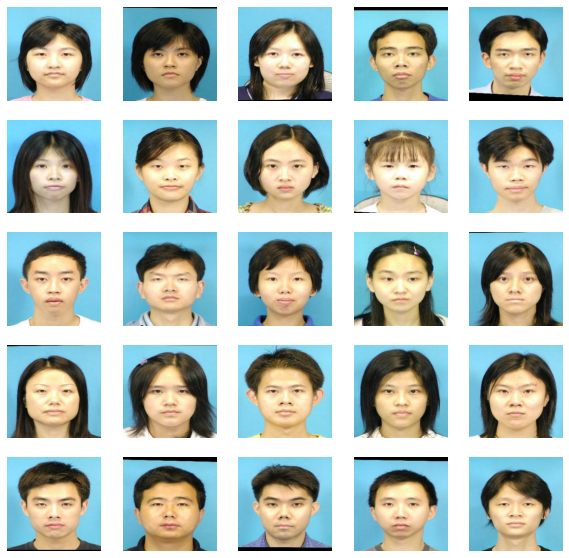

In [ ]:
"""
def prepare_Training(data, cache = True, shuffle_buffer_size = 1000):
  if cache:
    if isinstance(cache, str):
      data = data.cache(cache)
    else:
      data = data.cache()
  
  data = data.shuffle(buffer_size = shuffle_buffer_size)
  data = data.repeat()
  data = data.batch(BATCH_SIZE)

  data = data.prefetch(buffer_size = tf.data.experimental.AUTOTUNE)

  return data

def show_batch(img_batch):
  plt.figure(figsize=(10,10))
  for i in range(25):
    ax = plt.subplot(5,5,i+1)
    plt.imshow(img_batch[i])
    plt.axis('off')

trainingData = prepare_Training(trainImage)
image_batch = next(iter(trainingData))

show_batch(image_batch.numpy())
"""

In [51]:
def imageGeneration1(image, image_path, image_name, iterations):
  image_horizontal = cv2.flip(image, 1)
  names = image_name.split('.')
  fileName = names[0] + '_horizontal' + str(iterations) + '.jpg'
  cv2.imwrite(os.path.join(image_path, fileName), image_horizontal)

def imageGeneration2(image, image_path, image_name, iterations):
  image_vertical = cv2.flip(image, -1)
  names = image_name.split('.')
  fileName = names[0] + '_vertical' + str(iterations) + '.jpg'
  cv2.imwrite(os.path.join(image_path, fileName), image_vertical)

def imageGeneration3(image, image_path, image_name, iterations):
  image_HorVer_tmp = cv2.flip(image, 1)
  image_HorVer = cv2.flip(image_HorVer_tmp, -1)
  names = image_name.split('.')
  fileName = names[0] + '_HorVer' + str(iterations) + '.jpg'
  cv2.imwrite(os.path.join(image_path, fileName), image_HorVer)

def imageGeneration4(image, image_path, image_name, iterations):
  image_VerHor_tmp = cv2.flip(image, -1)
  image_VerHor = cv2.flip(image_VerHor_tmp, 1)
  names = image_name.split('.')
  fileName = names[0] + '_VerHor' + str(iterations) + '.jpg'
  cv2.imwrite(os.path.join(image_path, fileName), image_VerHor)

def imageGeneration5(image, image_path, image_name, iterations):
  image_rotate1 = cv2.rotate(image, cv2.ROTATE_90_CLOCKWISE)
  names = image_name.split('.')
  fileName = names[0] + '_rotate1' + str(iterations) + '.jpg'
  cv2.imwrite(os.path.join(image_path, fileName), image_rotate1) 

def imageGeneration6(image, image_path, image_name, iterations):
  image_rotate2 = cv2.rotate(image, cv2.ROTATE_90_COUNTERCLOCKWISE)
  names = image_name.split('.')
  fileName = names[0] + '_rotate2' + str(iterations) + '.jpg'
  cv2.imwrite(os.path.join(image_path, fileName), image_rotate2)

def imageGenerationMain(filePath, n_imgGenerate):
  fileNames = list(os.listdir(filePath))
  for i in range(n_imgGenerate):
    for j in range(len(fileNames)):
      fileName = fileNames[j]
      image = cv2.imread(os.path.join(filePath, fileName))
      imageGeneration1(image, image_path = filePath, image_name = fileName, iterations = i)
      imageGeneration2(image, image_path = filePath, image_name = fileName, iterations = i)
      imageGeneration3(image, image_path = filePath, image_name = fileName, iterations = i)
      imageGeneration4(image, image_path = filePath, image_name = fileName, iterations = i)
      imageGeneration5(image, image_path = filePath, image_name = fileName, iterations = i)
      imageGeneration6(image, image_path = filePath, image_name = fileName, iterations = i)
    print('Image generated, times: ', i+1)
  return True

In [52]:
filePath1 = '/content/SCC413/Keras_convVAE_dataset/CUHK_training_cropped_photos'
filePath2 = '/content/SCC413/Keras_convVAE_dataset/CUHK_training_cropped_sketches'
# every generation will create 6*N photos
n_imgGenerate = 5

imageGenerationMain(filePath1, n_imgGenerate)

Image generated, times:  1
Image generated, times:  2
Image generated, times:  3
Image generated, times:  4
Image generated, times:  5


True

In [53]:
imageGenerationMain(filePath2, n_imgGenerate)

Image generated, times:  1
Image generated, times:  2
Image generated, times:  3
Image generated, times:  4
Image generated, times:  5


True

In [54]:
print(len(os.listdir(filePath1)))
print(len(os.listdir(filePath2)))

2728
2728


In [55]:
#image to grayscale image
filePath1 = '/content/SCC413/Keras_convVAE_dataset/CUHK_training_cropped_photos'
filePath2 = '/content/SCC413/Keras_convVAE_dataset/CUHK_training_cropped_sketches'
filePath3 = '/content/SCC413/Keras_convVAE_dataset/CUHK_testing_cropped_photos'


def img2GSimg(filePath):
  images = []

  for fileName in os.listdir(filePath):
    if fileName.endswith('.jpg'):
      img_tmp = Image.open(os.path.join(filePath, fileName)).convert('L')
      img_tmp = img_tmp.resize((128, 128))
      img_array = np.array(img_tmp)
      images.append(img_array)
  return images

images  = img2GSimg(filePath1)
images2 = img2GSimg(filePath2)
images3 = img2GSimg(filePath3)

x_train = np.array(images).reshape((-1, 128, 128, 1)).astype('float32') / 255.
y_train = np.array(images2).reshape((-1, 128, 128, 1)).astype('float32') / 255.
x_test = np.array(images3).reshape((-1, 128, 128, 1)).astype('float32') / 255.

In [56]:
print(x_train.shape)
print(y_train.shape)
print(x_test.shape)

(2728, 128, 128, 1)
(2728, 128, 128, 1)
(100, 128, 128, 1)


In [57]:
input_shape = (128, 128, 1)
batch_size = 16
latent_dim = 2
encoder_layers = [64, 128, 256, 512]
decoder_layers = [64, 128, 128, 256, 256, 512, 512]

def sampling(args):
    z_mean, z_log_sigma = args
    epsilon = K.random_normal(shape=(K.shape(z_mean)[0], latent_dim),
                              mean=0., stddev=0.1)
    return z_mean + K.exp(z_log_sigma) * epsilon

# 编码器
inputs = Input(shape=input_shape)
x = inputs
for filters in encoder_layers:
    x = Conv2D(filters, kernel_size=3, strides=2, activation='LeakyReLU', padding='same')(x)
    x = BatchNormalization(axis=1)(x)
    x = MaxPooling2D(padding='same')(x)
shape_before_flattening = x.shape[1:]
x = Flatten()(x)
x = Dense(latent_dim, activation='LeakyReLU')(x)

z_mean = Dense(latent_dim, name='z_mean')(x)
z_log_var = Dense(latent_dim, name='z_log_var')(x)
z = Lambda(sampling, output_shape=(latent_dim,), name='z')([z_mean, z_log_var])

encoder = Model(inputs, [z_mean, z_log_var], name='encoder')

# 解码器
latent_inputs = Input(shape=(latent_dim,), name='z_sampling')
x = Dense(np.prod(shape_before_flattening))(latent_inputs)
x = Reshape(shape_before_flattening)(x)
for filters in decoder_layers:
    x = Conv2DTranspose(filters, kernel_size=3, strides=(2,2), activation='LeakyReLU', padding='same')(x)
x = Conv2DTranspose(1, kernel_size=3, activation='sigmoid', padding='same')(x)
decoder = Model(latent_inputs, x, name='decoder')

encoder.summary()
decoder.summary()

# VAE模型
reconstruction = decoder(z)
vae = Model(inputs, reconstruction, name='vae')

# 计算损失函数
reconstruction_loss = K.mean(K.binary_crossentropy(K.flatten(inputs), K.flatten(reconstruction)))
reconstruction_loss *= input_shape[0] * input_shape[1]
kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
kl_loss = K.sum(kl_loss, axis=-1)
kl_loss *= -0.5
vae_loss = K.mean(reconstruction_loss + kl_loss)
vae.add_loss(vae_loss)

# 编译模型
#vae.compile(optimizer='adam', loss=losses.mean_squared_error, metrics=['accuracy'])
vae.compile(optimizer='adam')

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 64, 64, 64)   640         ['input_1[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (None, 64, 64, 64)  256         ['conv2d[0][0]']                 
 alization)                                                                                       
                                                                                            

In [69]:
\
# 训练模型

callbacks_list = [ModelCheckpoint(filepath='best_model.h5', monitor='val_loss', save_best_only=True),
                  EarlyStopping(monitor='val_loss', patience=5)]

vae.fit(x_train, 
    y_train,
    epochs=200,
    batch_size=16,
    shuffle=False,
    validation_split=0.1,
    validation_freq=10
    #callbacks=callbacks_list
    )

# plot
plt.plot(vae.history.history["loss"])
plt.plot(vae.history.history["val_loss"])

Epoch 1/200
154/154 [==============================] - 58s 379ms/step - loss: 8999.6865
Epoch 2/200
154/154 [==============================] - 62s 401ms/step - loss: 8935.3857
Epoch 3/200
154/154 [==============================] - 64s 413ms/step - loss: 8920.2734
Epoch 4/200
 28/154 [====>.........................] - ETA: 52s - loss: 8911.3271

KeyboardInterrupt: ignored

In [59]:
# save model
vae.save('vae_model_2.0')

In [68]:
cp -r /content/vae_model_2.0/ /content/drive/MyDrive/

1/1 [==============================] - 0s 24ms/step


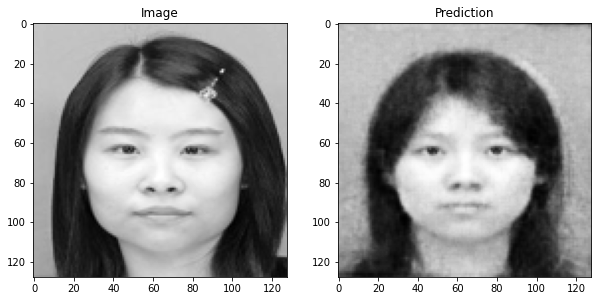

1/1 [==============================] - 0s 23ms/step


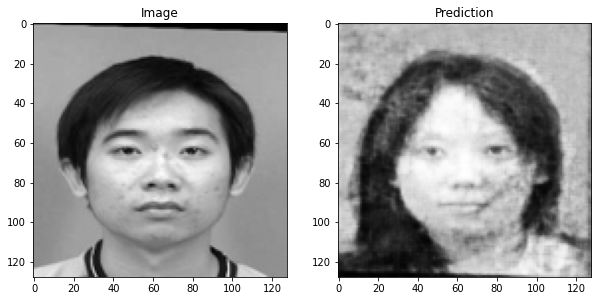

1/1 [==============================] - 0s 23ms/step


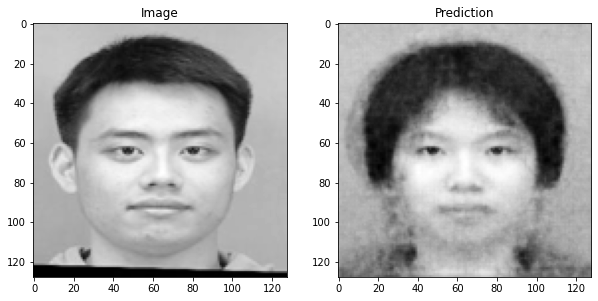

1/1 [==============================] - 0s 23ms/step


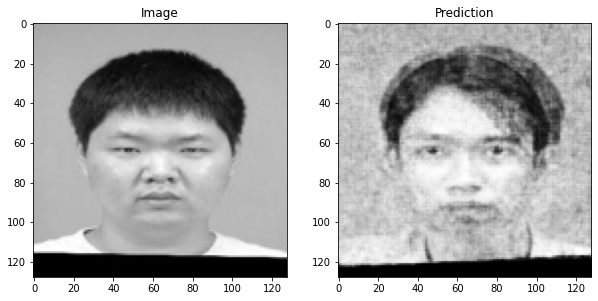

1/1 [==============================] - 0s 21ms/step


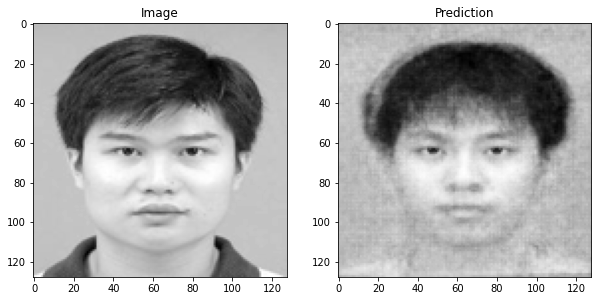

1/1 [==============================] - 0s 19ms/step


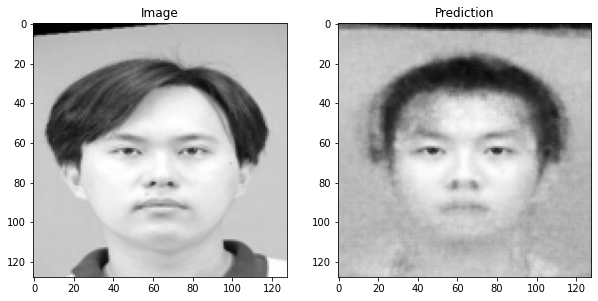

1/1 [==============================] - 0s 27ms/step


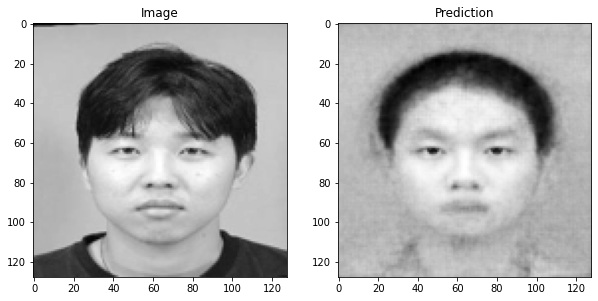

1/1 [==============================] - 0s 22ms/step


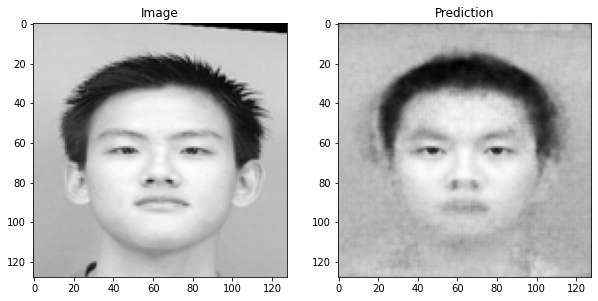

1/1 [==============================] - 0s 19ms/step


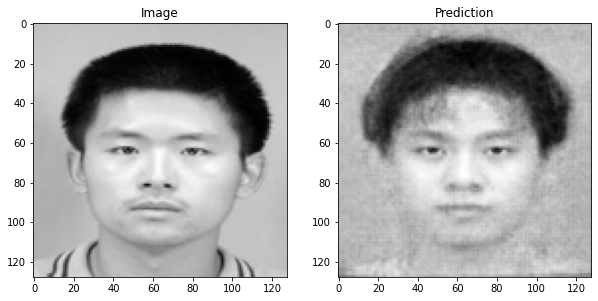

1/1 [==============================] - 0s 19ms/step


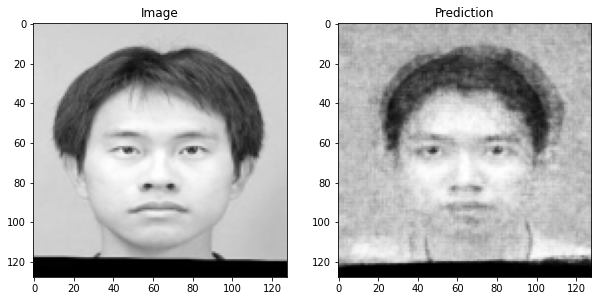

1/1 [==============================] - 0s 19ms/step


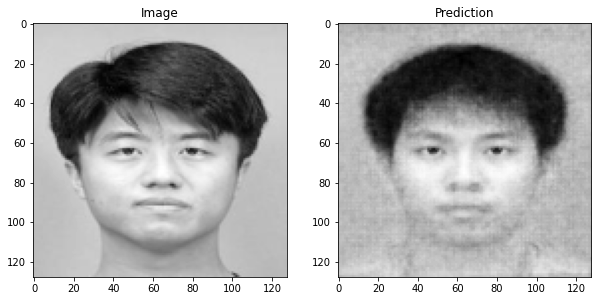

1/1 [==============================] - 0s 23ms/step


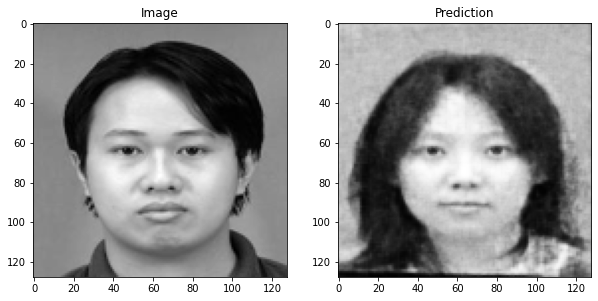

1/1 [==============================] - 0s 20ms/step


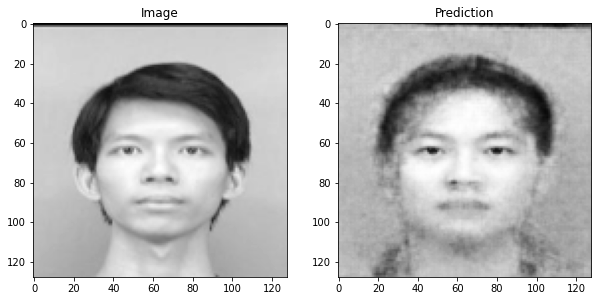

1/1 [==============================] - 0s 20ms/step


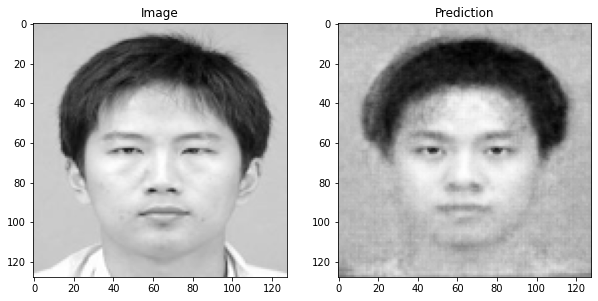

1/1 [==============================] - 0s 21ms/step


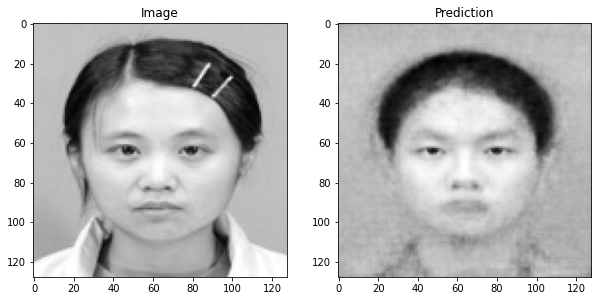

1/1 [==============================] - 0s 22ms/step


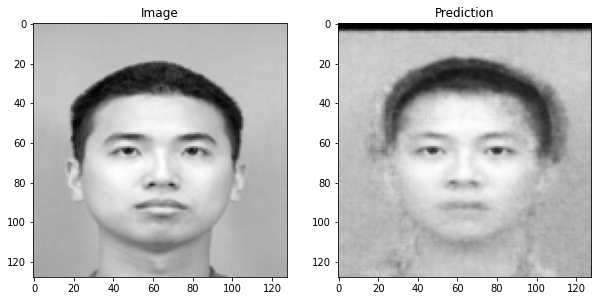

1/1 [==============================] - 0s 21ms/step


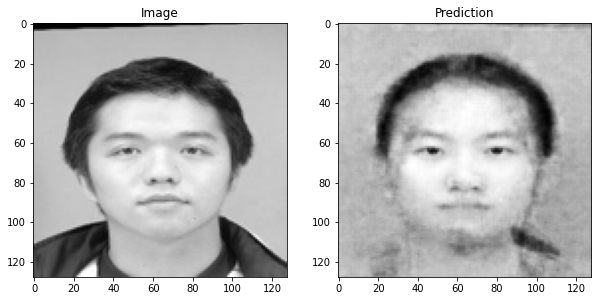

1/1 [==============================] - 0s 23ms/step


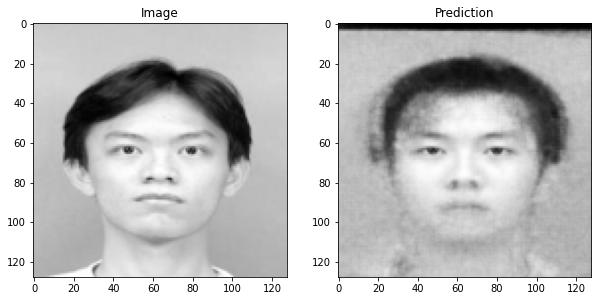

1/1 [==============================] - 0s 39ms/step


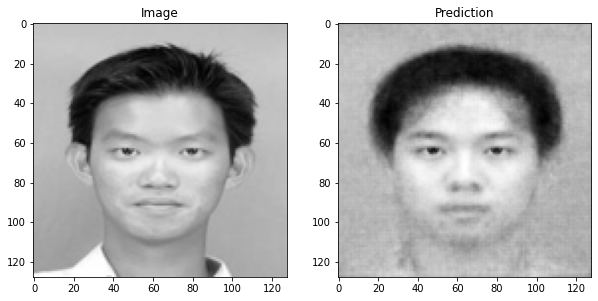

1/1 [==============================] - 0s 38ms/step


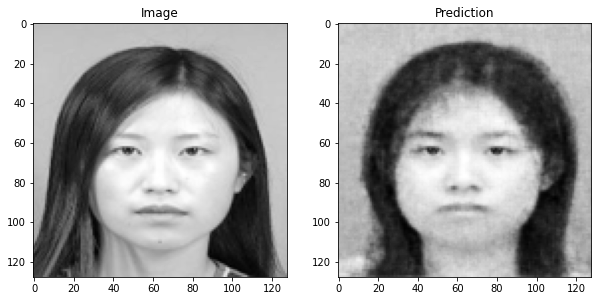

1/1 [==============================] - 0s 29ms/step


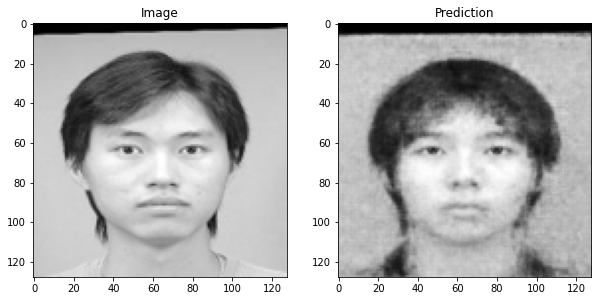

1/1 [==============================] - 0s 33ms/step


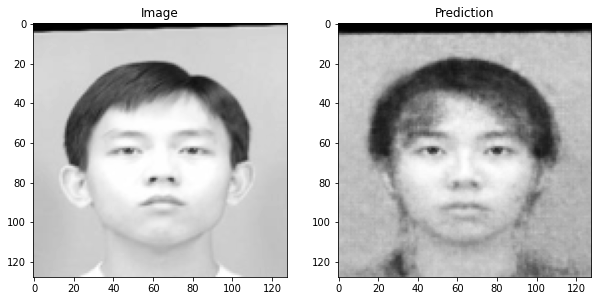

1/1 [==============================] - 0s 20ms/step


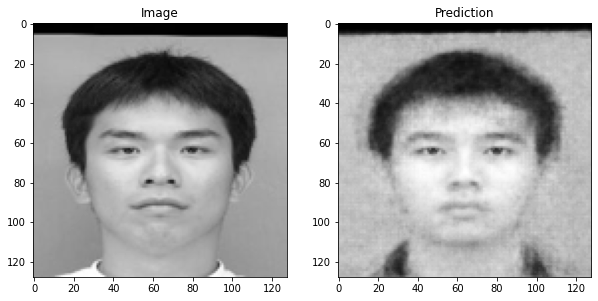

1/1 [==============================] - 0s 20ms/step


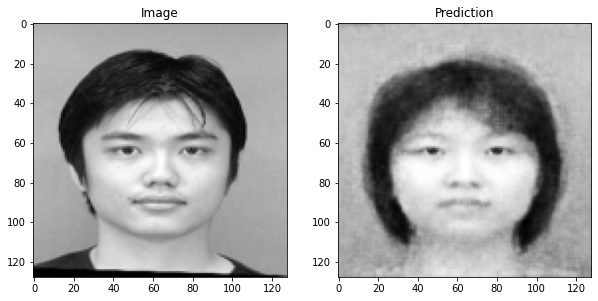

1/1 [==============================] - 0s 32ms/step


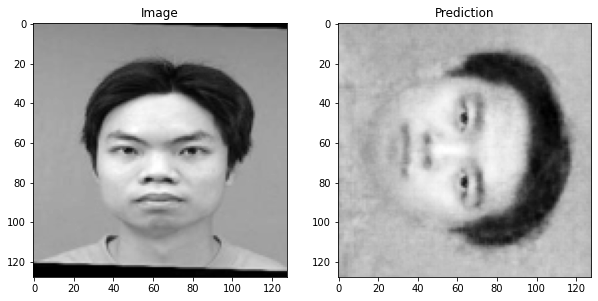

1/1 [==============================] - 0s 28ms/step


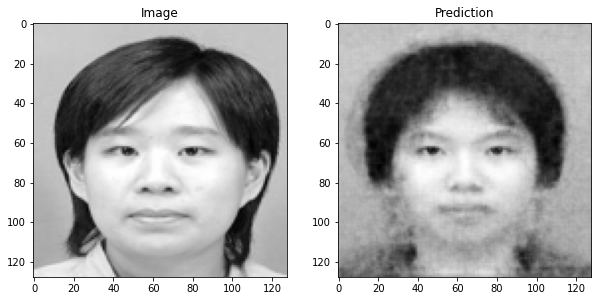

1/1 [==============================] - 0s 20ms/step


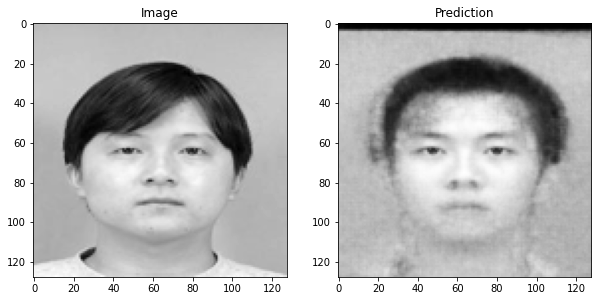

1/1 [==============================] - 0s 22ms/step


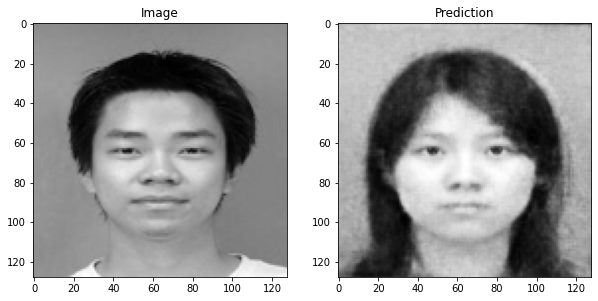

1/1 [==============================] - 0s 30ms/step


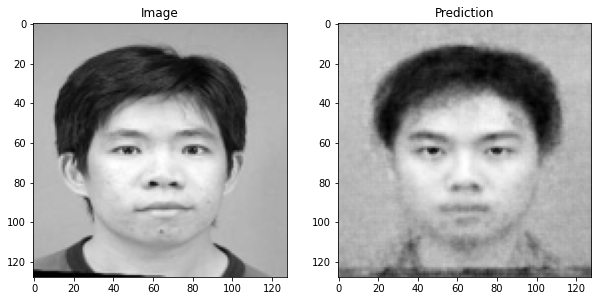

1/1 [==============================] - 0s 26ms/step


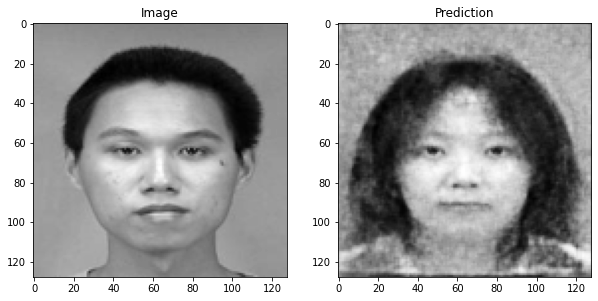

1/1 [==============================] - 0s 33ms/step


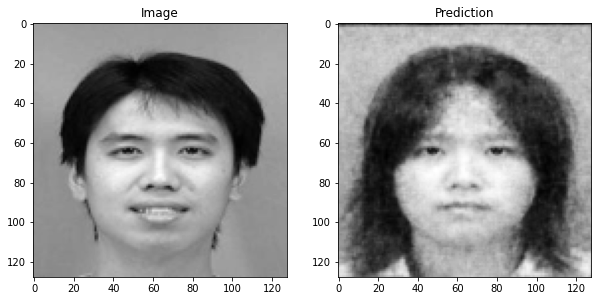

1/1 [==============================] - 0s 28ms/step


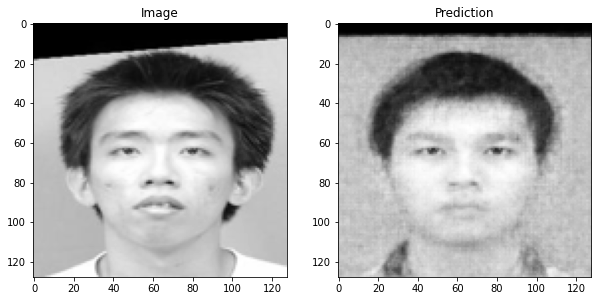

1/1 [==============================] - 0s 30ms/step


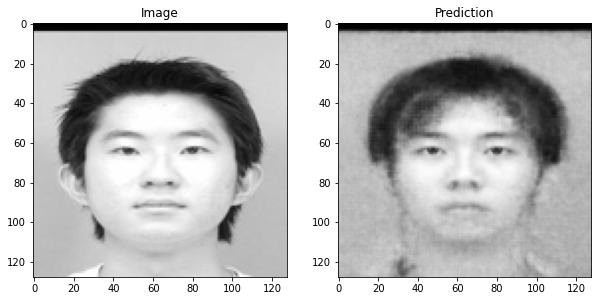

1/1 [==============================] - 0s 40ms/step


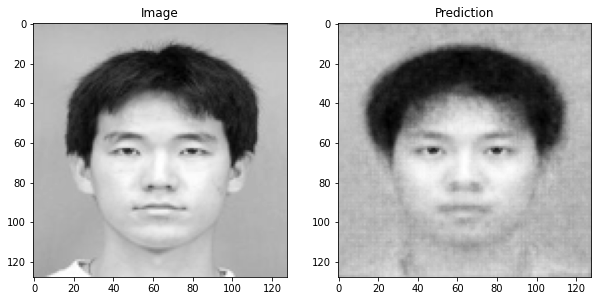

1/1 [==============================] - 0s 34ms/step


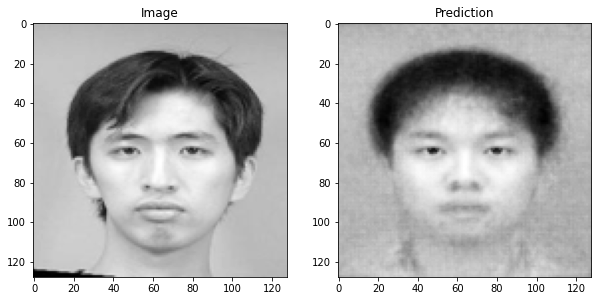

1/1 [==============================] - 0s 35ms/step


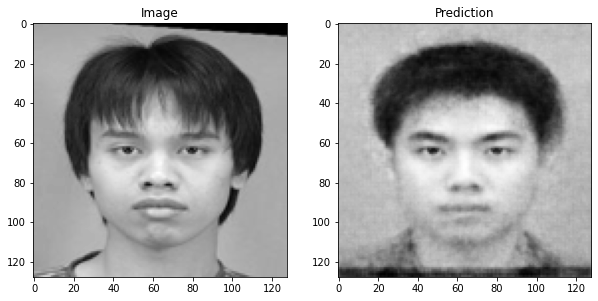

1/1 [==============================] - 0s 34ms/step


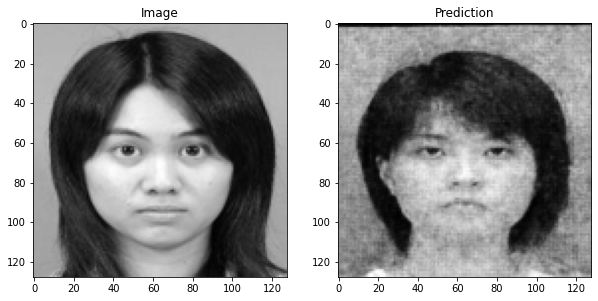

1/1 [==============================] - 0s 36ms/step


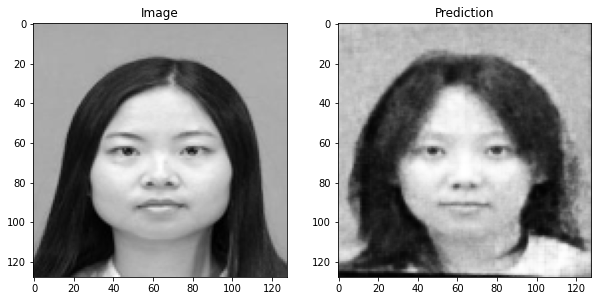

1/1 [==============================] - 0s 60ms/step


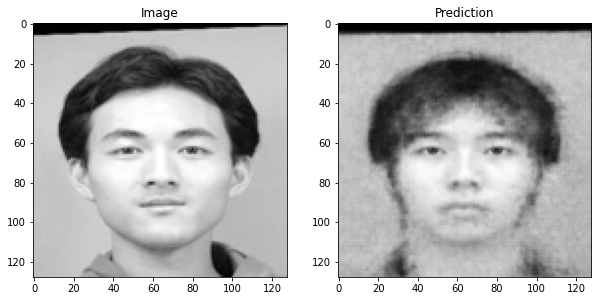

1/1 [==============================] - 0s 45ms/step


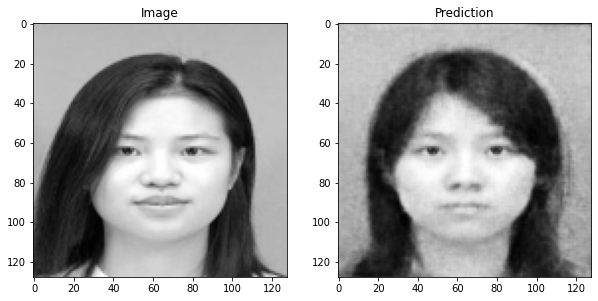

1/1 [==============================] - 0s 36ms/step


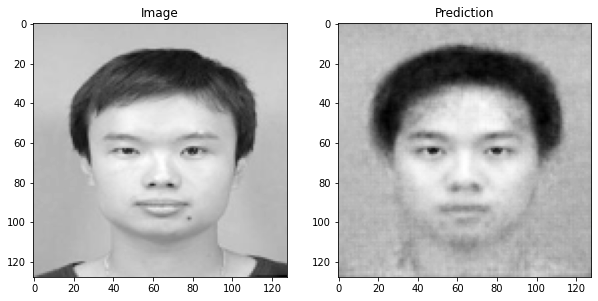

1/1 [==============================] - 0s 46ms/step


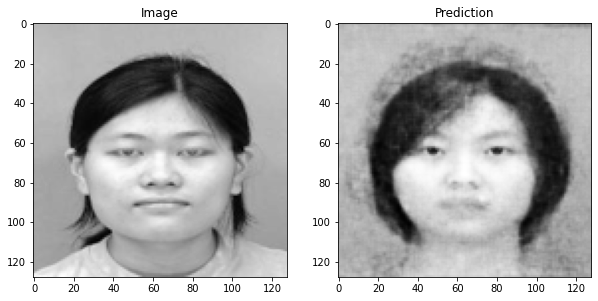

1/1 [==============================] - 0s 29ms/step


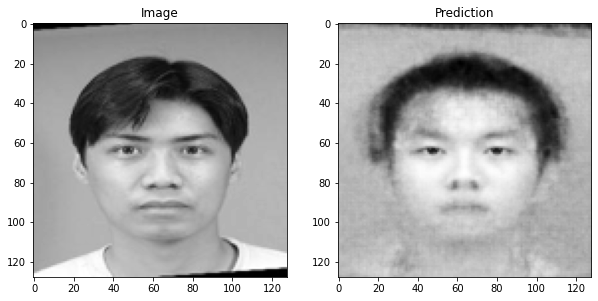

1/1 [==============================] - 0s 31ms/step


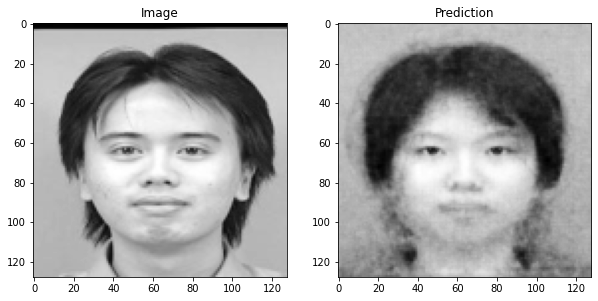

1/1 [==============================] - 0s 32ms/step


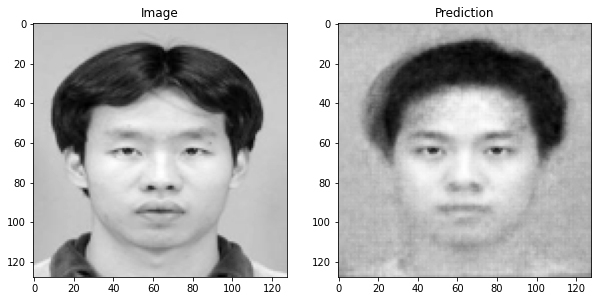

1/1 [==============================] - 0s 32ms/step


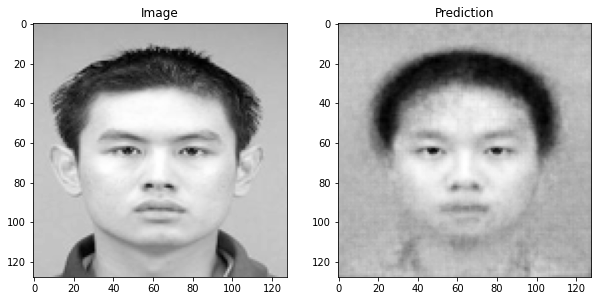

1/1 [==============================] - 0s 35ms/step


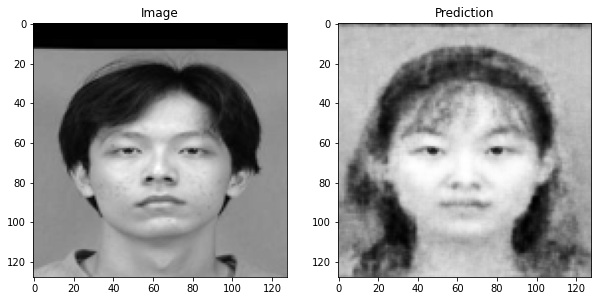

1/1 [==============================] - 0s 30ms/step


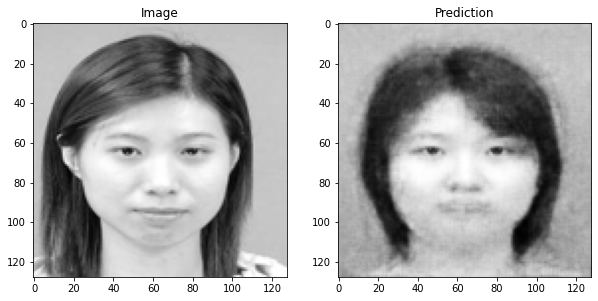

1/1 [==============================] - 0s 31ms/step


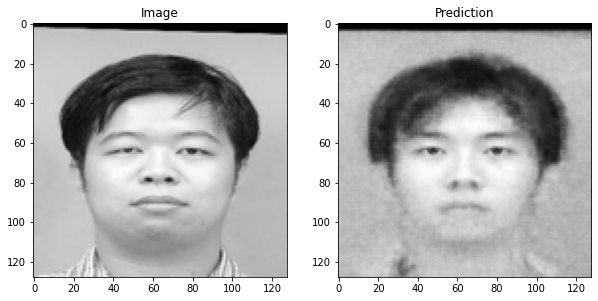

1/1 [==============================] - 0s 28ms/step


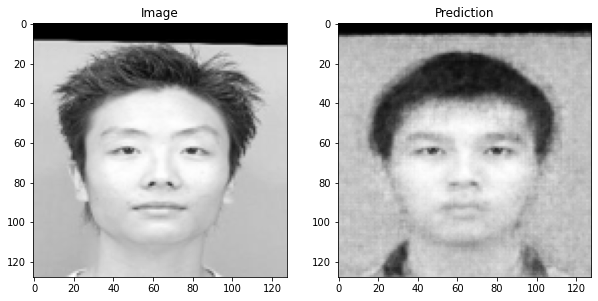

1/1 [==============================] - 0s 31ms/step


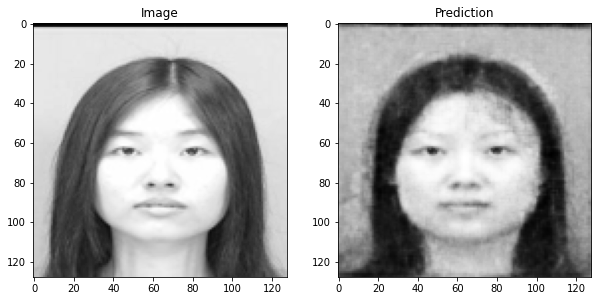

1/1 [==============================] - 0s 34ms/step


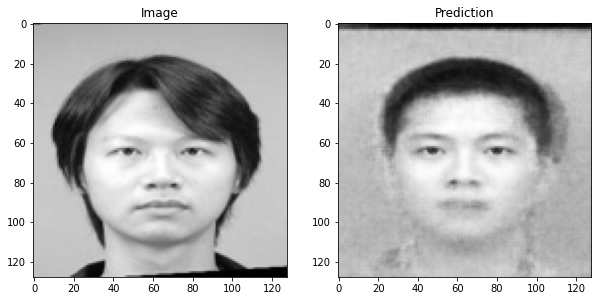

1/1 [==============================] - 0s 30ms/step


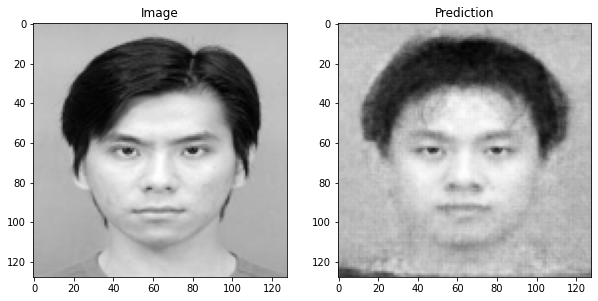

1/1 [==============================] - 0s 35ms/step


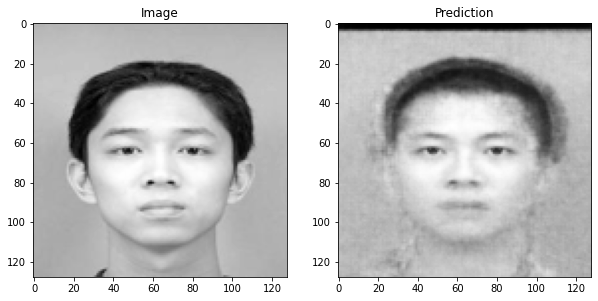

1/1 [==============================] - 0s 31ms/step


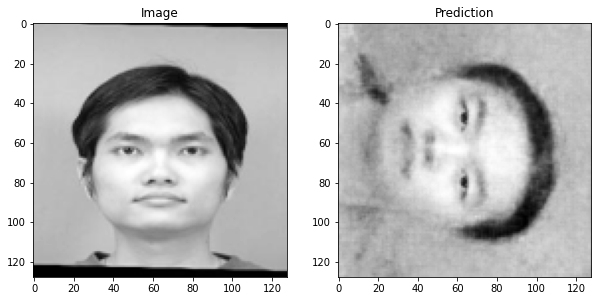

1/1 [==============================] - 0s 31ms/step


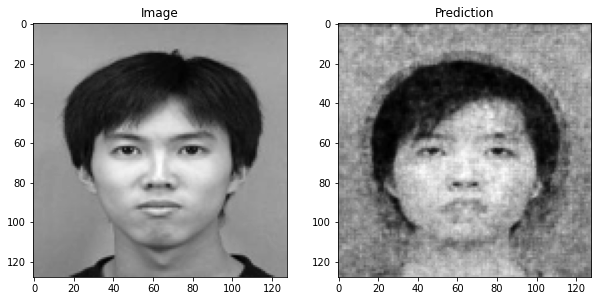

1/1 [==============================] - 0s 29ms/step


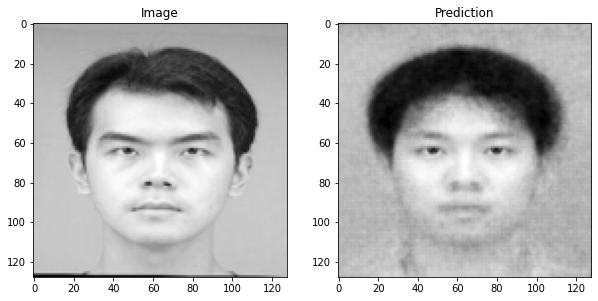

1/1 [==============================] - 0s 37ms/step


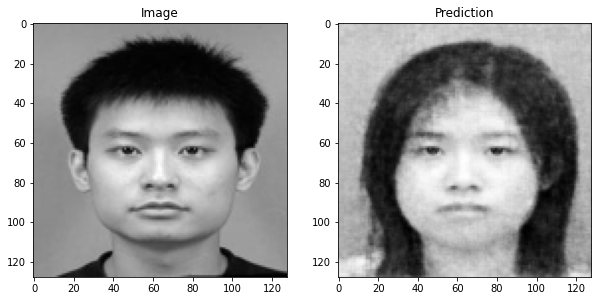

1/1 [==============================] - 0s 38ms/step


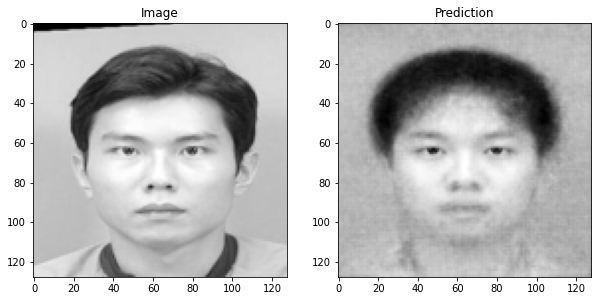

1/1 [==============================] - 0s 48ms/step


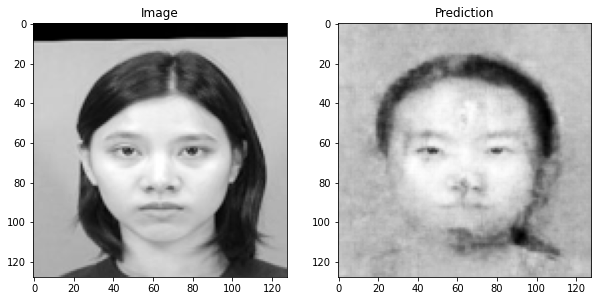

1/1 [==============================] - 0s 44ms/step


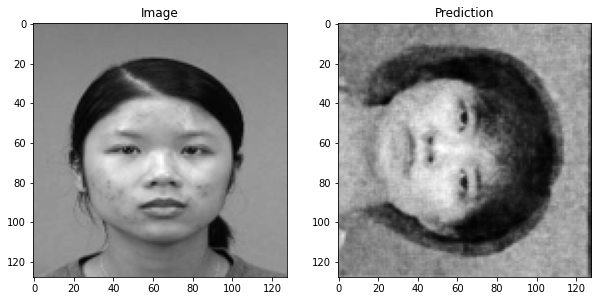

1/1 [==============================] - 0s 32ms/step


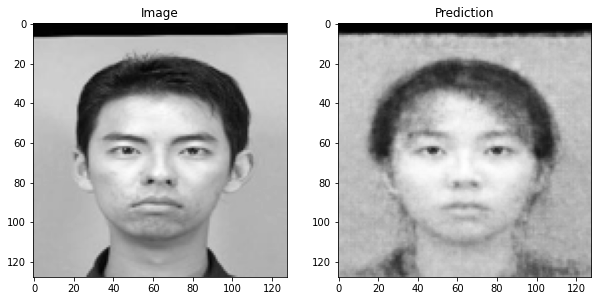

1/1 [==============================] - 0s 30ms/step


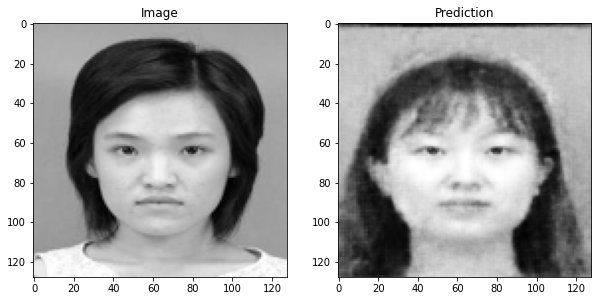

1/1 [==============================] - 0s 30ms/step


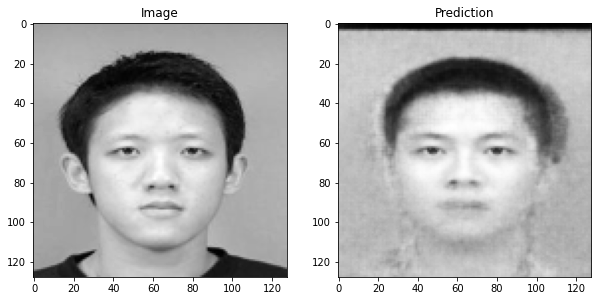

1/1 [==============================] - 0s 28ms/step


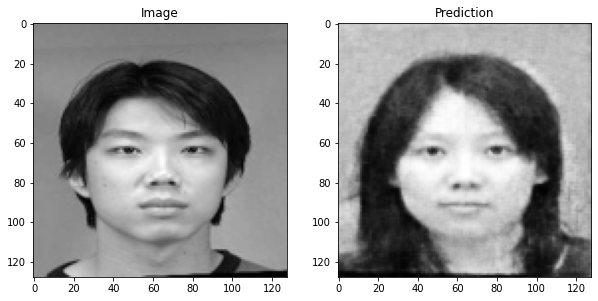

1/1 [==============================] - 0s 31ms/step


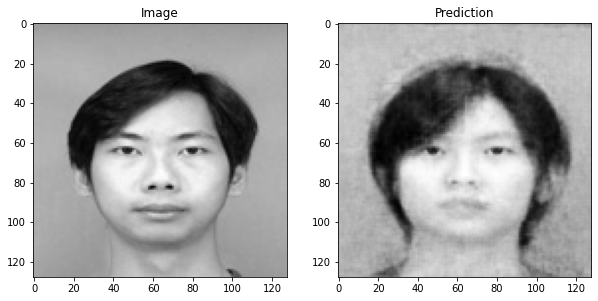

1/1 [==============================] - 0s 27ms/step


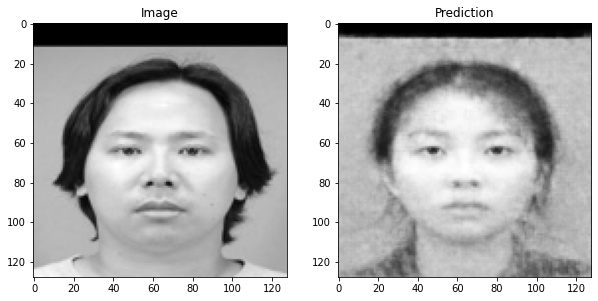

1/1 [==============================] - 0s 30ms/step


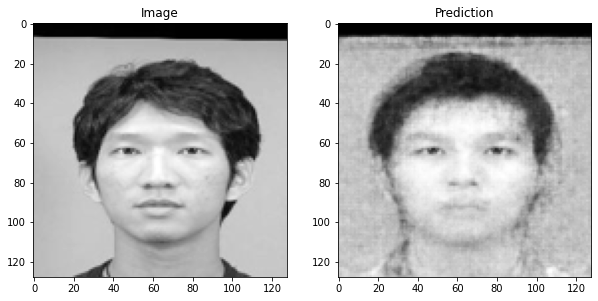

1/1 [==============================] - 0s 27ms/step


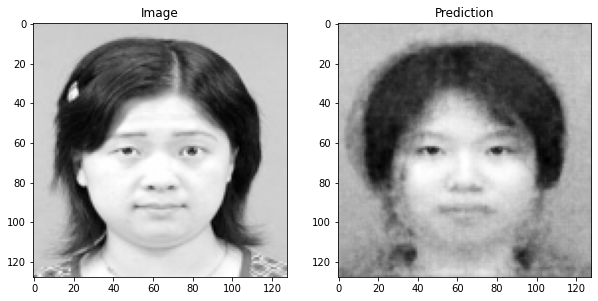

1/1 [==============================] - 0s 51ms/step


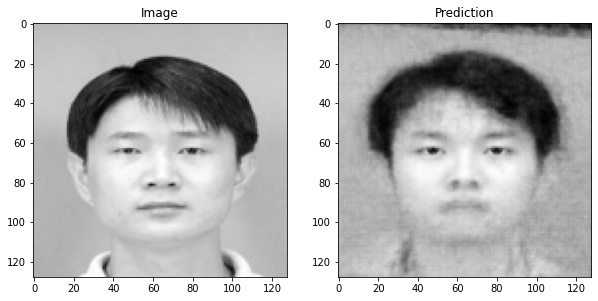

1/1 [==============================] - 0s 64ms/step


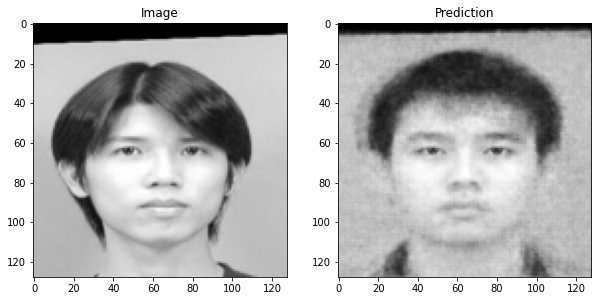

1/1 [==============================] - 0s 32ms/step


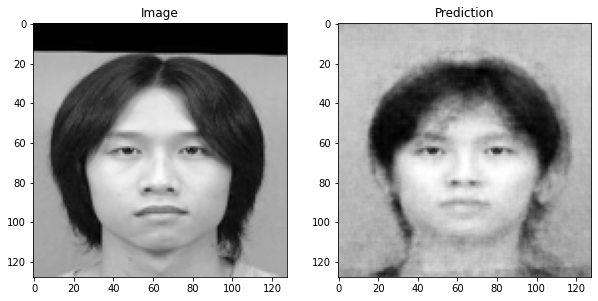

1/1 [==============================] - 0s 44ms/step


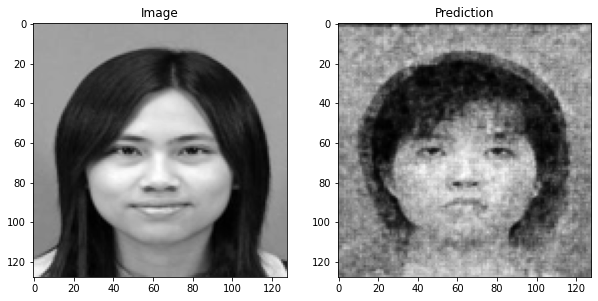

1/1 [==============================] - 0s 50ms/step


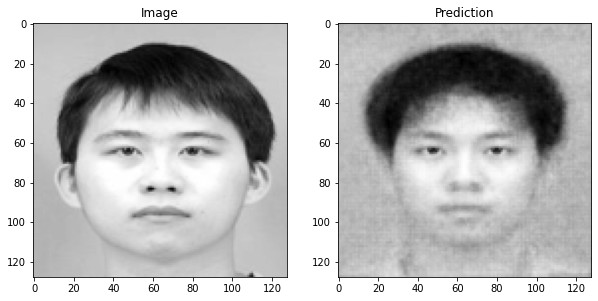

1/1 [==============================] - 0s 54ms/step


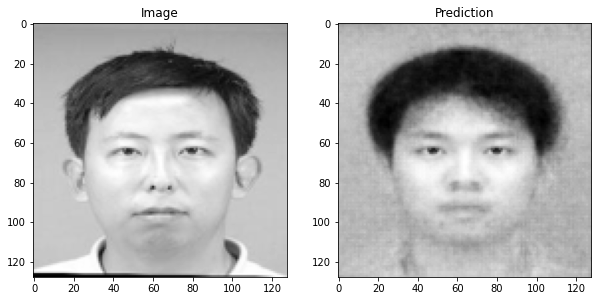

1/1 [==============================] - 0s 29ms/step


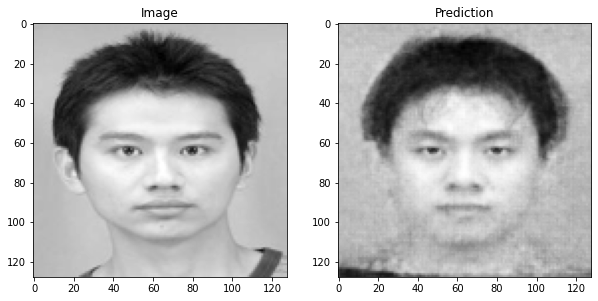

1/1 [==============================] - 0s 28ms/step


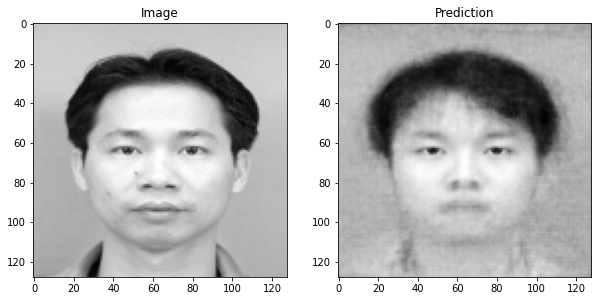

1/1 [==============================] - 0s 32ms/step


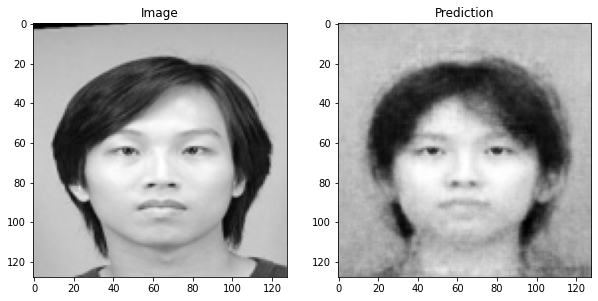

1/1 [==============================] - 0s 54ms/step


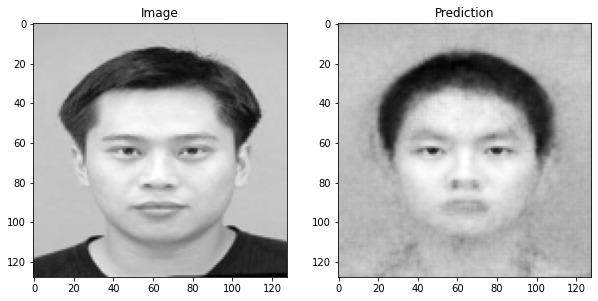

1/1 [==============================] - 0s 30ms/step


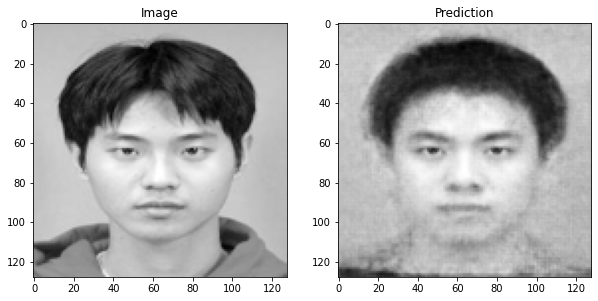

1/1 [==============================] - 0s 29ms/step


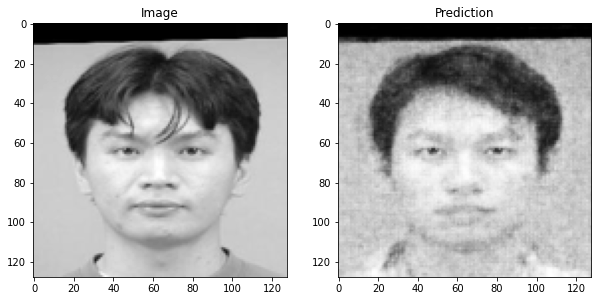

1/1 [==============================] - 0s 28ms/step


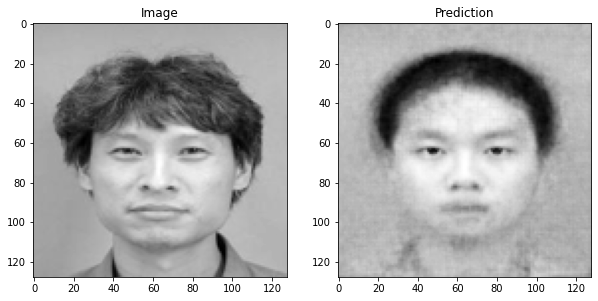

1/1 [==============================] - 0s 29ms/step


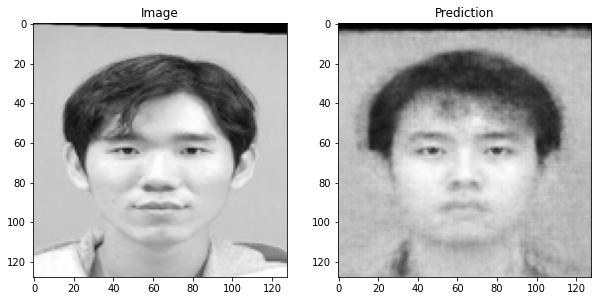

1/1 [==============================] - 0s 27ms/step


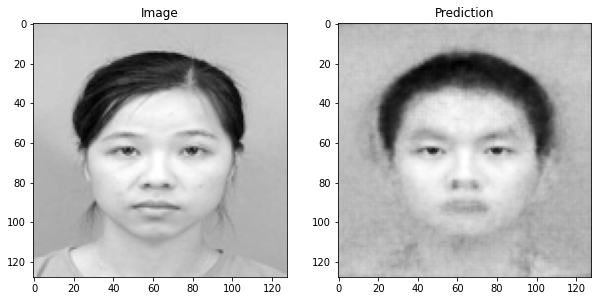

1/1 [==============================] - 0s 30ms/step


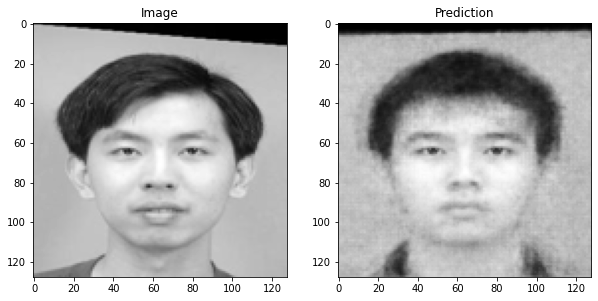

1/1 [==============================] - 0s 29ms/step


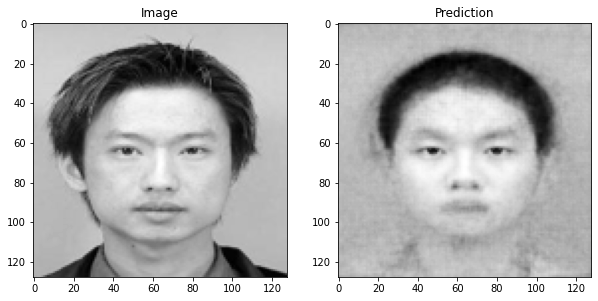

1/1 [==============================] - 0s 31ms/step


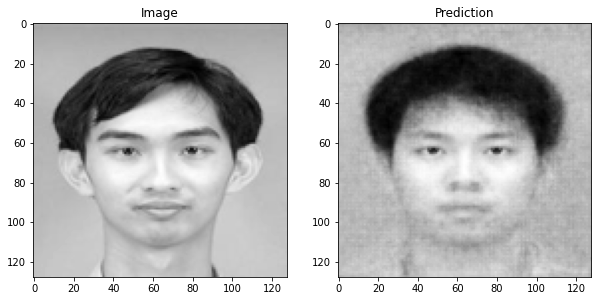

1/1 [==============================] - 0s 28ms/step


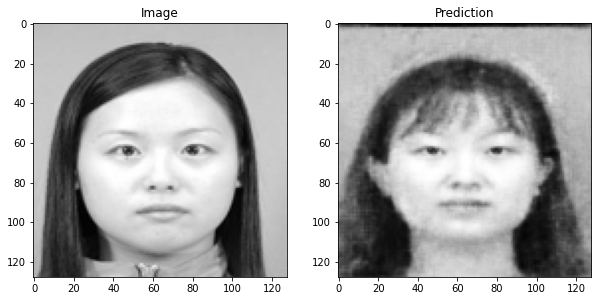

1/1 [==============================] - 0s 28ms/step


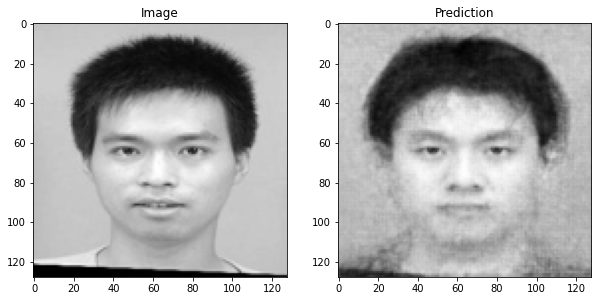

1/1 [==============================] - 0s 30ms/step


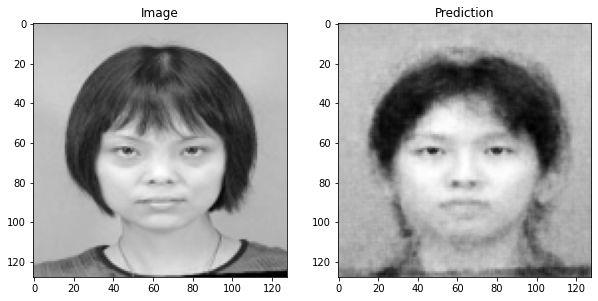

1/1 [==============================] - 0s 30ms/step


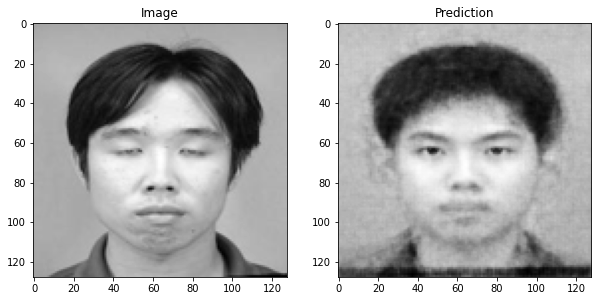

1/1 [==============================] - 0s 33ms/step


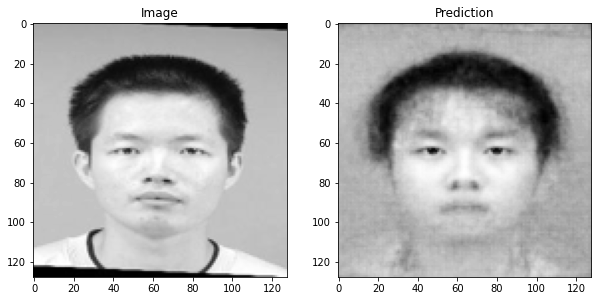

1/1 [==============================] - 0s 30ms/step


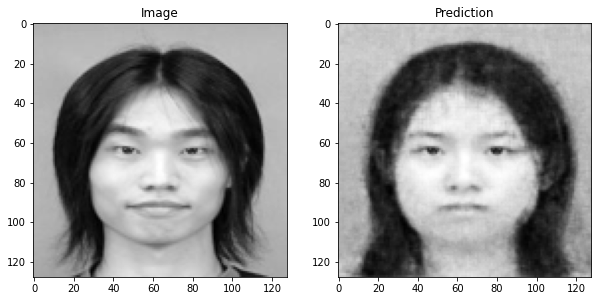

1/1 [==============================] - 0s 38ms/step


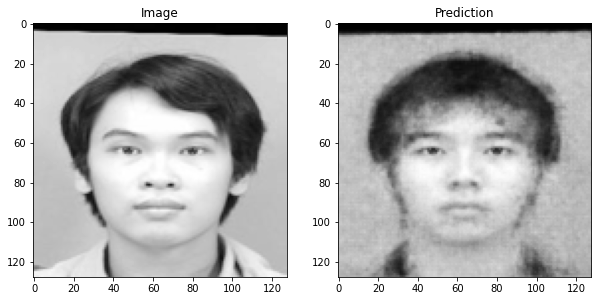

1/1 [==============================] - 0s 51ms/step


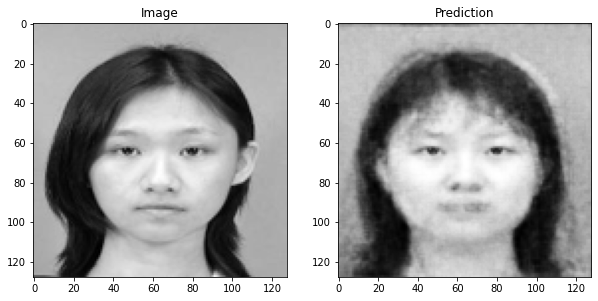

1/1 [==============================] - 0s 70ms/step


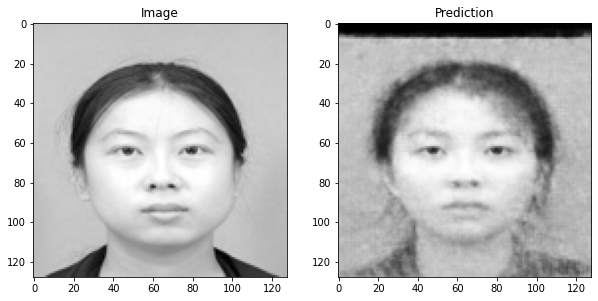

1/1 [==============================] - 0s 55ms/step


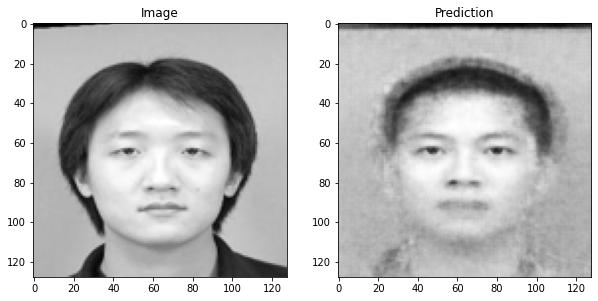

1/1 [==============================] - 0s 62ms/step


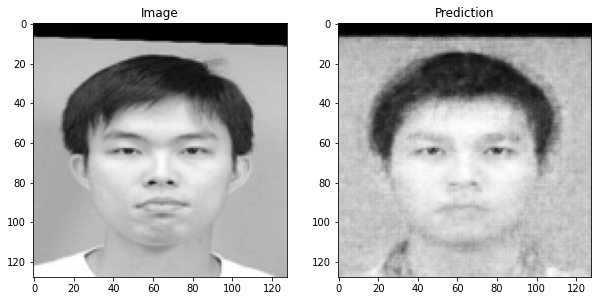

1/1 [==============================] - 0s 30ms/step


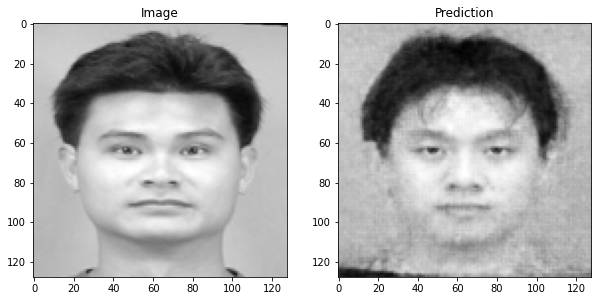

1/1 [==============================] - 0s 30ms/step


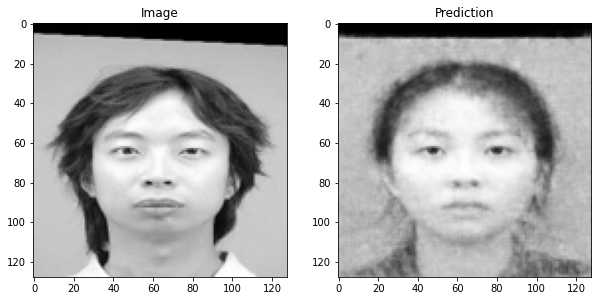

In [65]:
# 使用VAE模型生成素描图片
for fileName in os.listdir(filePath3):
    # 读取输入图片
    image_tmp = Image.open(os.path.join(filePath3, fileName)).convert('L')
    
    # 转换为模型的输入格式
    image_tmp = image_tmp.resize((128, 128))
    img_tmp = np.array(image_tmp).reshape((1,128,128,1)).astype('float32') / 255.

    # 使用VAE模型生成素描图片
    z_mean,_ = encoder.predict(img_tmp)
    sketch_img = decoder.predict(x=z_mean)

    # 转换为PIL Image格式并保存为文件
    sketch_img = sketch_img[0] * 255.
    #sketch_img = np.clip(sketch_img, 0, 255).astype('uint8')
    sketch_img = sketch_img.astype('uint8').reshape((*sketch_img.shape[:-1],))
    sketch_img = Image.fromarray(sketch_img)
    #sketch_filename = os.path.splitext(fileName)[0] + "_predSketch.jpg"
    #sketch_img.save(os.path.join(filePath, sketch_filename))

    # 显示生成的素描图片
    plt.figure(figsize = (10,10))
    plt.subplot(1,2,1)
    plt.title('Image')
    plt.imshow(image_tmp, cmap = 'gray')
    plt.subplot(1,2,2)
    plt.title('Prediction')
    plt.imshow(sketch_img, cmap = 'gray')
    plt.show()